In [1]:
# import libraries
import pandas as pd
import seaborn as sns
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12, 8)

In [2]:
df = pd.read_csv("movies.csv")

In [3]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [4]:
df.shape

(7668, 15)

In [5]:
# check for missing values
missing_values = df.isnull().sum()
print(missing_values)

name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64


In [6]:
# get the missing budget rows
missing_budget = df[df['budget'].isnull()]
print(missing_budget)

                  name     rating   genre  year  \
16                Fame          R   Drama  1980   
19          Stir Crazy          R  Comedy  1980   
24        Urban Cowboy         PG   Drama  1980   
25      Altered States          R  Horror  1980   
26     Little Darlings          R  Comedy  1980   
...                ...        ...     ...   ...   
7657              Leap        NaN   Drama  2020   
7659         I Am Fear  Not Rated  Horror  2020   
7660  Aloha Surf Hotel        NaN  Comedy  2020   
7664       Dream Round        NaN  Comedy  2020   
7667         Tee em el        NaN  Horror  2020   

                                released  score    votes            director  \
16          May 16, 1980 (United States)    6.6  21000.0         Alan Parker   
19     December 12, 1980 (United States)    6.8  26000.0      Sidney Poitier   
24          June 6, 1980 (United States)    6.4  14000.0       James Bridges   
25     December 25, 1980 (United States)    6.9  33000.0         Ke

In [7]:
genre_wise_budget = df[df['genre'] == 'Drama']
print(genre_wise_budget[['name', 'genre', 'year', 'budget']])

                           name  genre  year      budget
0                   The Shining  Drama  1980  19000000.0
13              Ordinary People  Drama  1980   6000000.0
15            Somewhere in Time  Drama  1980   5100000.0
16                         Fame  Drama  1980         NaN
24                 Urban Cowboy  Drama  1980         NaN
...                         ...    ...   ...         ...
7658  Black Wall Street Burning  Drama  2020      5000.0
7661           Love by Drowning  Drama  2020   1000000.0
7663               More to Life  Drama  2020      7000.0
7665              Saving Mbango  Drama  2020     58750.0
7666               It's Just Us  Drama  2020     15000.0

[1518 rows x 4 columns]


In [8]:
# fill the missing budget with mean value of budget of same genre
df['budget'] = df.groupby(['genre', 'year'])['budget'].transform(lambda x: x.fillna(x.mean()))    

# transform() in pandas is used to perform operations on a group of data while retaining the same shape as the original data.
# It can be applied to both Series and DataFrames and is often used in conjunction with groupby() to perform group-wise operations.

In [9]:
missing_values = df.isnull().sum()
print(missing_values)

name          0
rating       77
genre         0
year          0
released      2
score         3
votes         3
director      0
writer        3
star          1
country       3
budget       37
gross       189
company      17
runtime       4
dtype: int64


In [10]:
df.dropna(subset=['budget'], inplace=True)

In [11]:
missing_values = df.isnull().sum()
print(missing_values)

name          0
rating       70
genre         0
year          0
released      2
score         3
votes         3
director      0
writer        2
star          1
country       3
budget        0
gross       182
company      17
runtime       4
dtype: int64


In [12]:
df['score'] = df['score'].fillna(0)

In [13]:
df['votes'] = df['votes'].fillna(0)

In [14]:
df.dropna(subset=['star'], inplace=True)

In [15]:
missing_values = df.isnull().sum()
print(missing_values)

name          0
rating       69
genre         0
year          0
released      2
score         0
votes         0
director      0
writer        2
star          0
country       3
budget        0
gross       181
company      17
runtime       4
dtype: int64


In [16]:
mean_ratio = df['gross'].mean() / df['budget'].mean()

In [17]:
# fill the null values in gross column with 'budget * mean_ratio'
df['gross'] = df.apply(lambda x: x['budget']*mean_ratio if pd.isnull(x['gross']) else x['gross'], axis=1)

In [18]:
# fill the empty or null values in writer column with 'Unknown'
df['writer'] = df['writer'].fillna('Unknown')

In [19]:
# fill the empty or null values in company & country column with 'Unknown'
df['company'] = df['company'].fillna('Unknown')
df['country'] = df['country'].fillna('Unknown')

In [20]:
# drop the null values from released column
df.dropna(subset=['released'], inplace=True)

In [21]:
missing_values = df.isnull().sum()
print(missing_values)

name         0
rating      69
genre        0
year         0
released     0
score        0
votes        0
director     0
writer       0
star         0
country      0
budget       0
gross        0
company      0
runtime      2
dtype: int64


In [22]:
df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [23]:
# change the data-types of gross & budget column 
df['gross'] = df['gross'].astype('int64')
df['budget'] = df['budget'].astype('int64')

In [24]:
df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget        int64
gross         int64
company      object
runtime     float64
dtype: object

In [25]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0


In [26]:
df.sort_values(by=['gross'], inplace=False, ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3818,"Love, Honor and Obey",R,Comedy,2000,"February 9, 2001 (United States)",6.5,5200.0,Dominic Anciano,Dominic Anciano,Sadie Frost,United Kingdom,33000961,1400,British Broadcasting Corporation (BBC),103.0
7625,The Untold Story,NaN,Comedy,2019,"January 11, 2019 (United States)",5.7,320.0,Shane Stanley,Lee Stanley,Miko Hughes,United States,21857142,790,Visual Arts Entertainment,104.0
7580,Run with the Hunted,Not Rated,Crime,2019,"June 26, 2020 (United States)",5.2,735.0,John Swab,John Swab,Ron Perlman,United States,36500000,682,Roxwell Films,93.0
2417,Madadayo,NaN,Drama,1993,"April 17, 1993 (Japan)",7.3,5100.0,Akira Kurosawa,Ishirô Honda,Tatsuo Matsumura,Japan,11900000,596,DENTSU Music And Entertainment,134.0


In [27]:
# want to see all rows of a dataset
pd.set_option('display.max_rows', None)

In [28]:
df.sort_values(by=['gross'], inplace=False, ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0


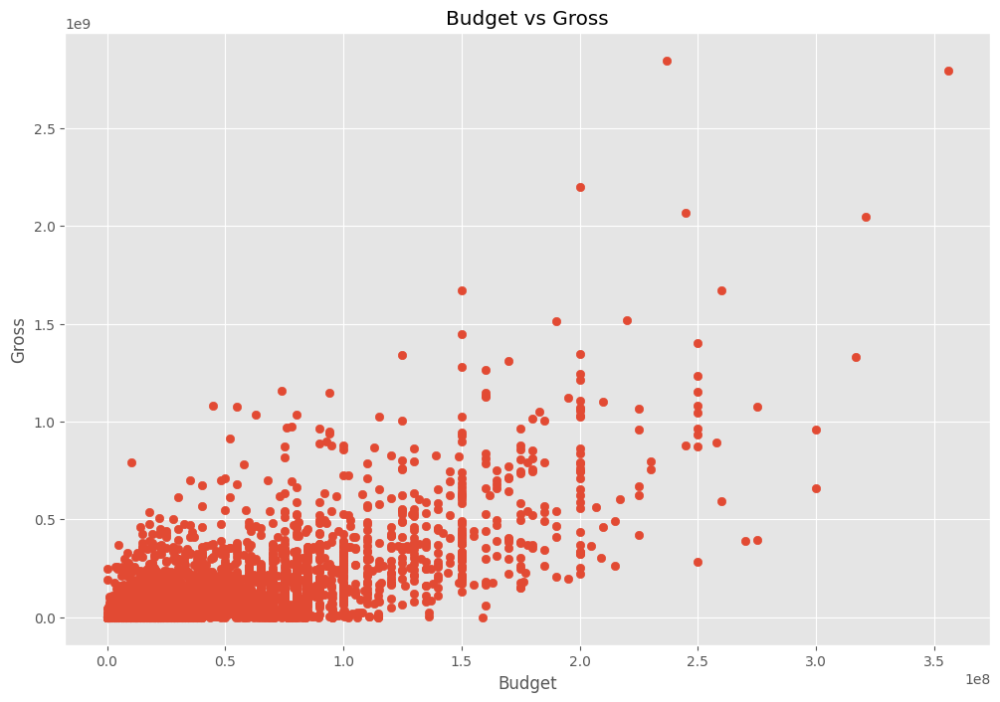

In [29]:
plt.scatter(x=df['budget'], y=df['gross'])

plt.title('Budget vs Gross')

plt.xlabel('Budget')
plt.ylabel('Gross')

plt.show()

<Axes: xlabel='budget', ylabel='gross'>

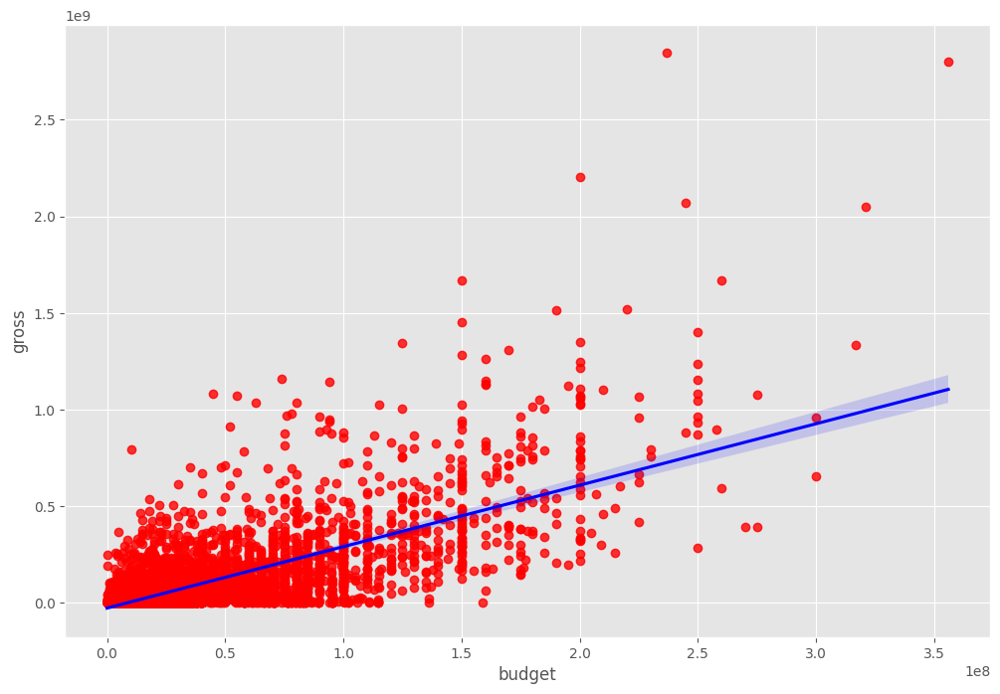

In [30]:
sns.regplot(x='budget', y='gross', data=df, scatter_kws={"color": "red"}, line_kws={"color": "blue"})

In [ ]:
# df.corr() effectively helps in understanding the relationships between variables in your dataset,
# guiding better data analysis and modeling decisions.
# types of corr : pearson(default), kendall, spearman

In [31]:
numeric_df = df.select_dtypes(include=[float, int])

correlation_matrix = numeric_df.corr()
correlation_matrix

,year,score,votes,budget,gross,runtime
year,1.000000,0.094786,0.222992,0.363155,0.259357,0.118518
score,0.094786,1.000000,0.408520,0.083527,0.186574,0.397066
votes,0.222992,0.408520,1.000000,0.441501,0.631405,0.308967
budget,0.363155,0.083527,0.441501,1.000000,0.716133,0.284585
gross,0.259357,0.186574,0.631405,0.716133,1.000000,0.244831
runtime,0.118518,0.397066,0.308967,0.284585,0.244831,1.000000


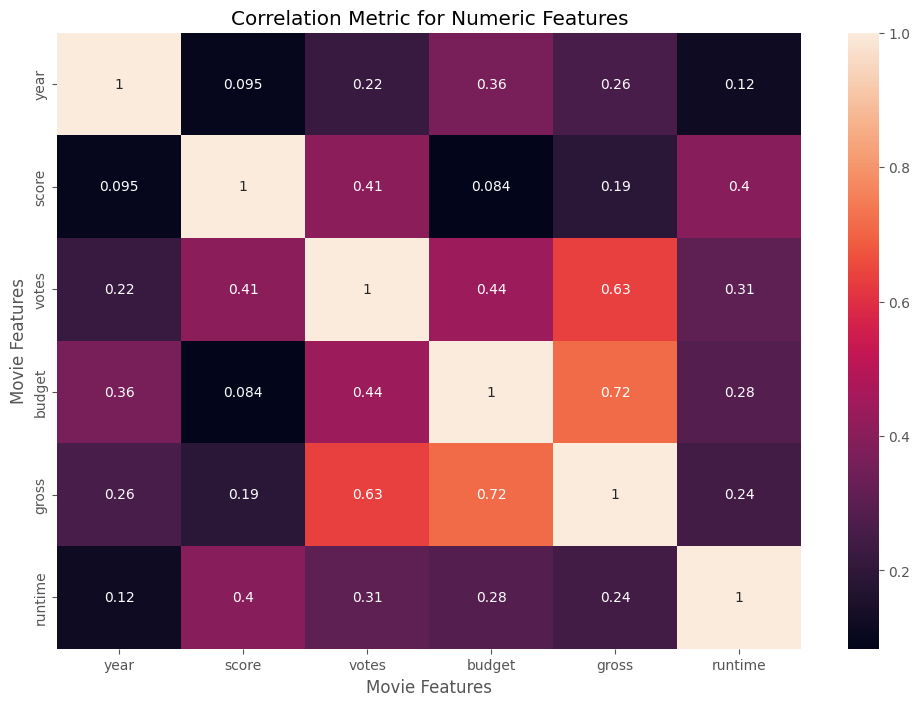

In [32]:
sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Metric for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()

In [34]:
df_numerized = df.copy()    

# convert all the non-numeric values to numeric for eg. company anme, country, etc
for col in df_numerized.columns:
    if(df_numerized[col].dtype == 'object'):
       df_numerized[col] = df_numerized[col].astype('category')
       df_numerized[col] = df_numerized[col].cat.codes

df_numerized


,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,6551,6,6,1980,1701,8.4,927000.0,2570,3993,1040,54,19000000,46998772,2296,146.0
1,5543,6,1,1980,1488,5.8,65000.0,2255,1625,325,55,4500000,58853106,721,104.0
2,5114,4,0,1980,1767,8.7,1200000.0,1104,2555,1735,55,18000000,538375067,1524,124.0
3,284,4,4,1980,1488,7.7,221000.0,1292,1992,2230,55,3500000,83453539,1793,88.0
4,1022,6,4,1980,1539,7.3,108000.0,1047,519,407,55,6000000,39846344,1759,98.0
5,2097,6,9,1980,2492,6.4,123000.0,2510,4338,240,55,550000,39754601,1793,95.0
6,5544,6,0,1980,1767,7.9,188000.0,1403,834,1268,55,27000000,115229890,2257,133.0
7,4410,6,3,1980,696,8.2,330000.0,1818,1762,2224,55,18000000,23402427,622,129.0
8,5252,4,0,1980,1749,6.8,101000.0,2291,1971,872,55,54000000,108185706,873,127.0
9,6180,6,3,1980,2276,7.0,10000.0,2841,422,585,55,10000000,15795189,2248,100.0


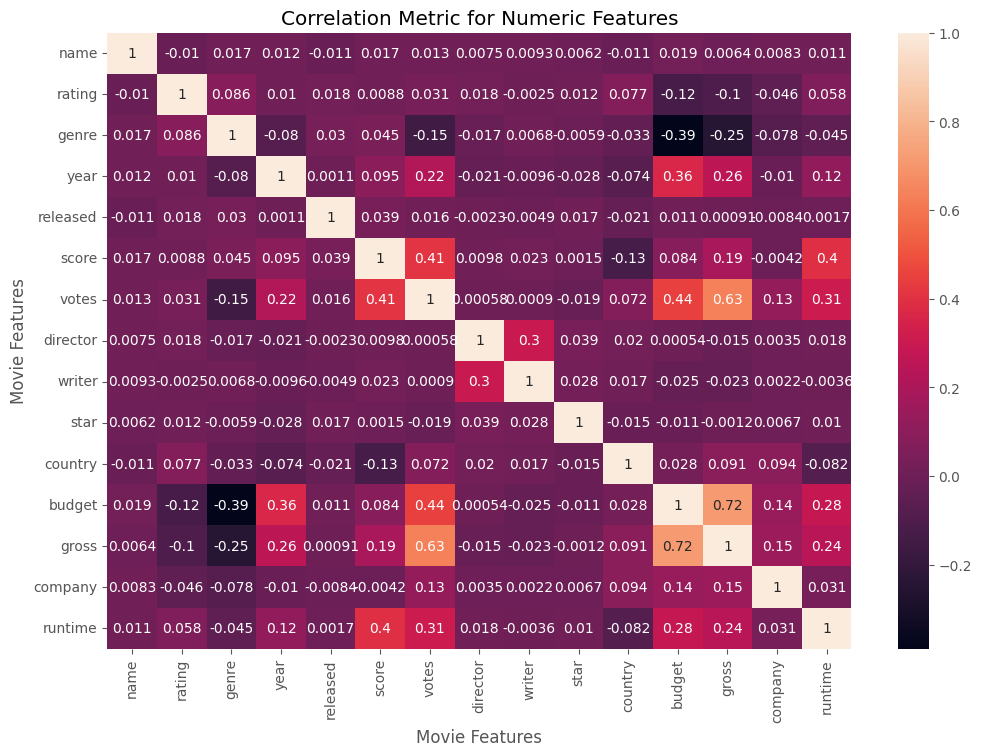

In [35]:
correlation_matrix = df_numerized.corr()

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Metric for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()

In [36]:
correlation_matrix = df_numerized.corr()

corr_pairs = correlation_matrix.unstack()
corr_pairs

name      name        1.000000
          rating     -0.010155
          genre       0.016653
          year        0.011625
          released   -0.010865
          score       0.016913
          votes       0.012754
          director    0.007482
          writer      0.009335
          star        0.006181
          country    -0.010669
          budget      0.018783
          gross       0.006382
          company     0.008313
          runtime     0.010716
rating    name       -0.010155
          rating      1.000000
          genre       0.085725
          year        0.010101
          released    0.017715
          score       0.008750
          votes       0.030520
          director    0.018499
          writer     -0.002481
          star        0.011841
          country     0.077177
          budget     -0.124746
          gross      -0.103543
          company    -0.046343
          runtime     0.058190
genre     name        0.016653
          rating      0.085725
        

In [37]:
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

genre     budget     -0.389425
budget    genre      -0.389425
genre     gross      -0.246248
gross     genre      -0.246248
genre     votes      -0.151917
votes     genre      -0.151917
country   score      -0.133453
score     country    -0.133453
rating    budget     -0.124746
budget    rating     -0.124746
gross     rating     -0.103543
rating    gross      -0.103543
country   runtime    -0.081502
runtime   country    -0.081502
year      genre      -0.079513
genre     year       -0.079513
company   genre      -0.078279
genre     company    -0.078279
year      country    -0.073703
country   year       -0.073703
rating    company    -0.046343
company   rating     -0.046343
runtime   genre      -0.044594
genre     runtime    -0.044594
country   genre      -0.033052
genre     country    -0.033052
star      year       -0.028103
year      star       -0.028103
writer    budget     -0.025045
budget    writer     -0.025045
gross     writer     -0.023259
writer    gross      -0.023259
year    

In [40]:
high_corr = sorted_pairs[sorted_pairs > 0.5]
high_corr

gross     votes       0.631405
votes     gross       0.631405
budget    gross       0.716133
gross     budget      0.716133
name      name        1.000000
director  director    1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
votes     votes       1.000000
score     score       1.000000
released  released    1.000000
year      year        1.000000
genre     genre       1.000000
rating    rating      1.000000
company   company     1.000000
runtime   runtime     1.000000
dtype: float64